# Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.pipeline import Pipeline

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering

from sklearn import metrics
from sklearn.metrics.cluster import calinski_harabasz_score, adjusted_rand_score

import sys
import warnings

if not sys.warnoptions:
    warnings.simplefilter("ignore")

# Exploration

In [2]:
df = pd.read_csv('raw data.csv', index_col=[0])

In [3]:
df = df[df['InvoiceDate'] <= '2011-12-01 23:59:59']

In [4]:
df = df[df.StockCode != 'B']

# Feature Engineering

In [5]:
df['TotalRevenue'] = df['Quantity'] * df['UnitPrice']

In [6]:
invoice_count = df.groupby(['CustomerID'], as_index=False)['InvoiceNo'].count()

In [7]:
invoice_count.rename(columns={'InvoiceNo': 'frequency'}, inplace=True)

In [8]:
customer_total_revenue = df.groupby(['CustomerID'], as_index=False)['TotalRevenue'].sum()

In [9]:
customer_total_revenue.rename(columns={'TotalRevenue': 'monetary'}, inplace=True)

In [10]:
customer_total_revenue.monetary = round(customer_total_revenue.monetary, 2)

In [11]:
customer_total_revenue_invoice_count = customer_total_revenue.merge(invoice_count, on='CustomerID', sort=True)

In [12]:
df['InvoiceDate']= pd.to_datetime(df['InvoiceDate'])

In [13]:
df['DaysSincePurchase'] = df['InvoiceDate'].max() - df['InvoiceDate']

In [14]:
customer_since_purchase = df.groupby(['CustomerID'], as_index=False)['DaysSincePurchase'].min()

In [15]:
RecentPurchase = customer_since_purchase['DaysSincePurchase']

In [16]:
RecentPurchaseDays = [None] * len(RecentPurchase)

In [17]:
for i in range(len(RecentPurchase)):
    RecentPurchaseDays[i] = RecentPurchase[i].days

In [18]:
customer_df = customer_total_revenue_invoice_count

In [19]:
customer_df['recency'] = RecentPurchaseDays

In [20]:
df.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'TotalRevenue',
       'DaysSincePurchase'],
      dtype='object')

In [21]:
customer_df['quantity'] = df.groupby(['CustomerID'], as_index=False)['Quantity'].sum()['Quantity']

In [22]:
customer_df.head()

,CustomerID,monetary,frequency,recency,quantity
0,12346.0,0.00,2,317,0
1,12347.0,4085.18,171,31,2266
2,12348.0,1797.24,31,67,2341
3,12349.0,1757.55,73,10,631
4,12350.0,334.40,17,302,197


# Log Transform

In [23]:
monetary_nz = customer_df['monetary'].apply(lambda x: 0.1 if x <= 0 else x)
frequency_nz = customer_df['frequency'].apply(lambda x: 0.1 if x <= 0 else x)
recency_nz = customer_df['recency'].apply(lambda x: 0.1 if x <= 0 else x)
quantity_nz = customer_df['quantity'].apply(lambda x: 0.1 if x <= 0 else x)

In [24]:
log_features = pd.DataFrame()
log_features['monetary'] = np.log(monetary_nz)
log_features['frequency'] = np.log(frequency_nz)
log_features['recency'] = np.log(recency_nz)
log_features['quantity'] = np.log(quantity_nz)
# log_features['customers'] = customer_df.CustomerID

In [25]:
log_features.head()

,monetary,frequency,recency,quantity
0,-2.302585,0.693147,5.758902,-2.302585
1,8.315121,5.141664,3.433987,7.725771
2,7.494007,3.433987,4.204693,7.758333
3,7.471676,4.290459,2.302585,6.447306
4,5.812338,2.833213,5.710427,5.283204


# Scaled Features

In [26]:
# scaler = StandardScaler()
# scaled_df = scaler.fit_transform(log_features)

# Pipeline

In [110]:
kmeans_sil_current = 0
kmeans_ca_current = 0

kmeans_sil_final_i = 0
kmeans_sil_final_j = 0
kmeans_sil_init = 0

kmeans_ca_final_i = 0
kmeans_ca_final_j = 0
kmeans_ca_init = 0

K-Means Solution with 2 clusters & 2 components
-----------------------
Calinski-Harabaz (CA) Cluster Variance Ration score:  2883.7974707284093
Cluster Silhouette score:  0.3750057306690094


Summary Stats for cluster # 0
            quantity      recency    frequency       monetary
count    2088.000000  2088.000000  2088.000000    2088.000000
mean     2050.710249    38.952107   163.079502    3468.978875
std      6369.076389    50.139724   303.121517   11241.837925
min       132.000000     0.000000     4.000000     187.690000
25%       569.750000     8.000000    59.000000     987.122500
50%       956.000000    21.000000   101.000000    1610.305000
75%      1776.500000    52.000000   176.250000    2996.360000
max    188761.000000   358.000000  7637.000000  267761.000000
This cluster represents 48.18% of the population and 90.53% of Total Revenue, with a total spend of £7243227.89




Summary Stats for cluster # 1
           quantity      recency    frequency     monetary
count   2246.0

Summary Stats for cluster # 2
         quantity     recency   frequency     monetary
count   60.000000   60.000000   60.000000    60.000000
mean   -28.183333  224.883333    9.833333  -215.088167
std     71.580816  123.708116   26.757648   635.231592
min   -303.000000    9.000000    1.000000 -4287.630000
25%    -12.000000  132.000000    1.000000  -102.112500
50%     -1.000000  271.000000    2.500000   -17.400000
75%      0.000000  350.250000    6.000000     0.000000
max     59.000000  364.000000  202.000000   246.000000
This cluster represents 1.38% of the population and -0.16% of Total Revenue, with a total spend of £-12905.29




K-Means Solution with 3 clusters & 4 components
-----------------------
Calinski-Harabaz (CA) Cluster Variance Ration score:  2438.8943123975005
Cluster Silhouette score:  0.38564357961877754


Summary Stats for cluster # 0
            quantity      recency    frequency       monetary
count    2076.000000  2076.000000  2076.000000    2076.000000
mean     2060

K-Means Solution with 4 clusters & 4 components
-----------------------
Calinski-Harabaz (CA) Cluster Variance Ration score:  2530.6322878323117
Cluster Silhouette score:  0.3330462811818391


Summary Stats for cluster # 0
           quantity      recency    frequency     monetary
count   2198.000000  2198.000000  2198.000000  2198.000000
mean     205.272975   134.776160    23.192903   353.651947
std      332.600419   109.010207    19.121610   254.889529
min        0.000000     0.000000     1.000000     0.000000
25%       90.000000    36.000000    10.000000   177.112500
50%      160.000000   107.500000    19.000000   305.685000
75%      260.750000   226.000000    30.000000   457.665000
max    12540.000000   365.000000   148.000000  3096.000000
This cluster represents 50.72% of the population and 9.71% of Total Revenue, with a total spend of £777326.98




Summary Stats for cluster # 1
           quantity      recency    frequency      monetary
count   1489.000000  1489.000000  1489.000

Summary Stats for cluster # 3
           quantity     recency   frequency     monetary
count    775.000000  775.000000  775.000000   775.000000
mean      98.922581  195.251613   10.939355   178.733406
std      451.002683  105.992881    8.959004   122.449311
min        0.000000    3.000000    1.000000     0.000000
25%       43.000000  104.000000    5.000000   110.505000
50%       74.000000  207.000000    9.000000   155.050000
75%      110.000000  276.000000   14.000000   217.050000
max    12540.000000  365.000000   70.000000  2033.100000
This cluster represents 17.88% of the population and 1.73% of Total Revenue, with a total spend of £138518.39




Summary Stats for cluster # 4
         quantity     recency   frequency     monetary
count   56.000000   56.000000   56.000000    56.000000
mean   -30.321429  230.750000   10.232143  -235.835536
std     73.664623  124.471866   27.647779   652.368550
min   -303.000000    9.000000    1.000000 -4287.630000
25%    -12.000000  134.750000    1.000

Summary Stats for cluster # 5
           quantity     recency   frequency     monetary
count    578.000000  578.000000  578.000000   578.000000
mean      93.077855  183.942907    8.013841   157.878564
std      521.780746  105.209843    5.844888   124.563316
min        0.000000    6.000000    1.000000     0.000000
25%       36.000000   85.250000    4.000000    98.770000
50%       63.000000  189.000000    7.000000   135.915000
75%       92.750000  269.000000   10.000000   185.587500
max    12540.000000  365.000000   36.000000  2033.100000
This cluster represents 13.34% of the population and 1.14% of Total Revenue, with a total spend of £91253.81




K-Means Solution with 6 clusters & 3 components
-----------------------
Calinski-Harabaz (CA) Cluster Variance Ration score:  2456.2303098807038
Cluster Silhouette score:  0.2942592164805782


Summary Stats for cluster # 0
          quantity     recency   frequency     monetary
count   501.000000  501.000000  501.000000   501.000000
mean    1

Summary Stats for cluster # 5
           quantity     recency   frequency     monetary
count    689.000000  689.000000  689.000000   689.000000
mean     107.698113  175.072569    7.862119   179.464746
std      488.865478  110.707466    5.245970   147.690411
min        0.000000    0.000000    1.000000     0.000000
25%       39.000000   66.000000    4.000000   103.300000
50%       71.000000  178.000000    7.000000   145.350000
75%      105.000000  267.000000   10.000000   207.150000
max    12540.000000  365.000000   31.000000  2033.100000
This cluster represents 15.9% of the population and 1.55% of Total Revenue, with a total spend of £123651.21




K-Means Solution with 7 clusters & 2 components
-----------------------
Calinski-Harabaz (CA) Cluster Variance Ration score:  2534.512646754248
Cluster Silhouette score:  0.2893394669025199


Summary Stats for cluster # 0
         quantity     recency   frequency     monetary
count  508.000000  508.000000  508.000000   508.000000
mean   190.9

Summary Stats for cluster # 4
         quantity     recency   frequency     monetary
count   56.000000   56.000000   56.000000    56.000000
mean   -30.321429  230.750000   10.232143  -235.835536
std     73.664623  124.471866   27.647779   652.368550
min   -303.000000    9.000000    1.000000 -4287.630000
25%    -12.000000  134.750000    1.000000  -104.925000
50%     -1.000000  285.500000    2.500000   -22.950000
75%      0.000000  351.000000    6.000000     0.000000
max     59.000000  364.000000  202.000000    12.750000
This cluster represents 1.29% of the population and -0.17% of Total Revenue, with a total spend of £-13206.79




Summary Stats for cluster # 5
          quantity      recency    frequency     monetary
count  1099.000000  1099.000000  1099.000000  1099.000000
mean    271.073703   161.540491    28.955414   457.259390
std     247.192585    94.827544    19.048132   262.692457
min      52.000000    31.000000     1.000000    97.970000
25%     152.000000    72.000000    16.000

Summary Stats for cluster # 2
          quantity     recency   frequency     monetary
count   641.000000  641.000000  641.000000   641.000000
mean    764.168487   14.344774   97.312012  1284.128565
std     432.580967    8.087298   60.637287   710.180361
min     170.000000    1.000000    4.000000   320.720000
25%     476.000000    8.000000   55.000000   773.990000
50%     684.000000   14.000000   85.000000  1119.930000
75%     956.000000   21.000000  121.000000  1612.790000
max    5256.000000   39.000000  421.000000  6977.040000
This cluster represents 14.79% of the population and 10.29% of Total Revenue, with a total spend of £823126.41




Summary Stats for cluster # 3
         quantity     recency   frequency     monetary
count   55.000000   55.000000   55.000000    55.000000
mean   -31.709091  232.272727    9.763636  -240.123455
std     73.601196  125.091589   27.677350   657.584387
min   -303.000000    9.000000    1.000000 -4287.630000
25%    -12.000000  134.500000    1.000000  -10

Summary Stats for cluster # 7
          quantity     recency   frequency     monetary
count   764.000000  764.000000  764.000000   764.000000
mean    925.267016   82.823298   89.410995  1473.808691
std     713.469826   57.772718   62.249182   844.115488
min     178.000000   27.000000    4.000000   324.240000
25%     509.000000   44.000000   48.000000   877.145000
50%     759.500000   64.000000   73.000000  1261.595000
75%    1132.000000   99.250000  113.000000  1837.440000
max    8000.000000  358.000000  548.000000  7829.890000
This cluster represents 17.63% of the population and 14.07% of Total Revenue, with a total spend of £1125989.84




K-Means Solution with 8 clusters & 4 components
-----------------------
Calinski-Harabaz (CA) Cluster Variance Ration score:  2466.470118930243
Cluster Silhouette score:  0.27702675672239185


Summary Stats for cluster # 0
            quantity     recency    frequency       monetary
count     464.000000  464.000000   464.000000     464.000000
mean 

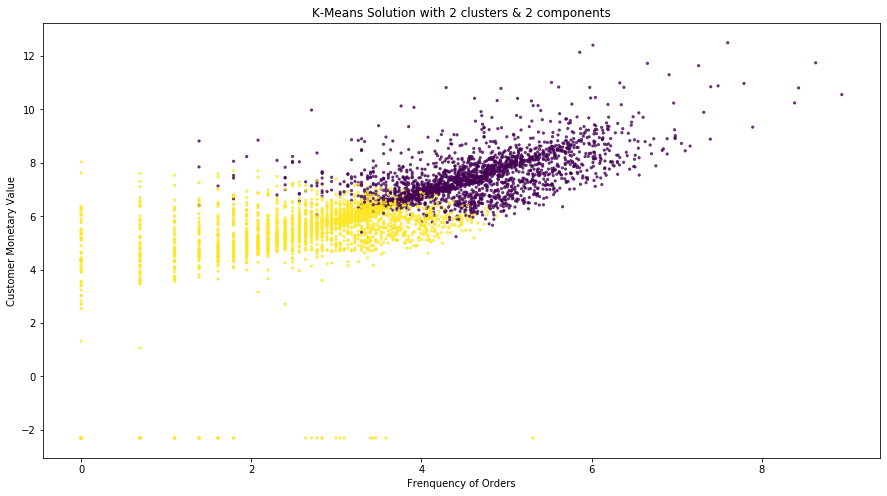

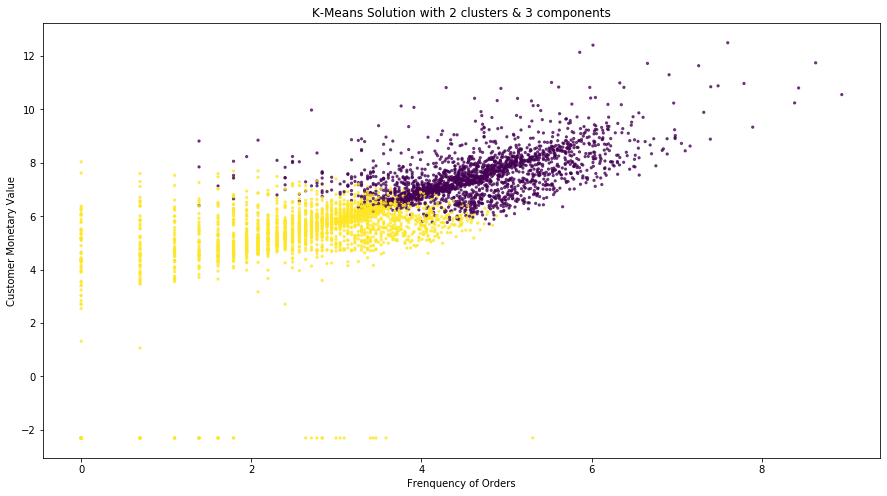

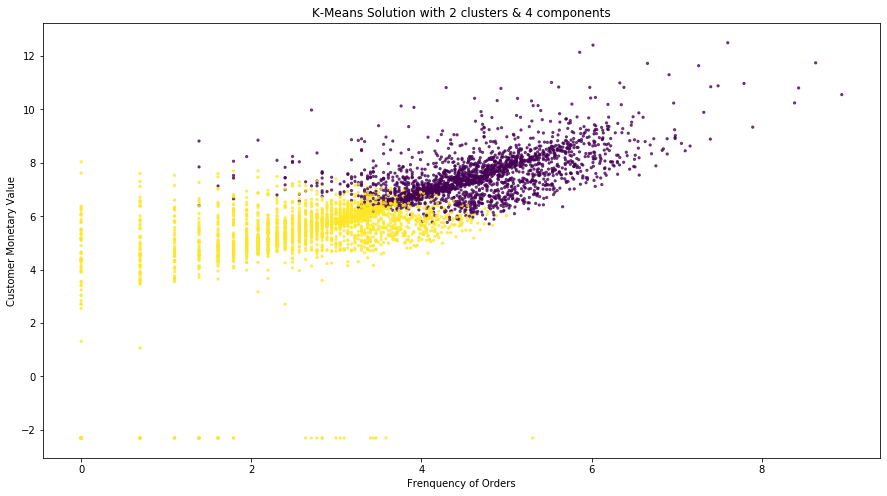

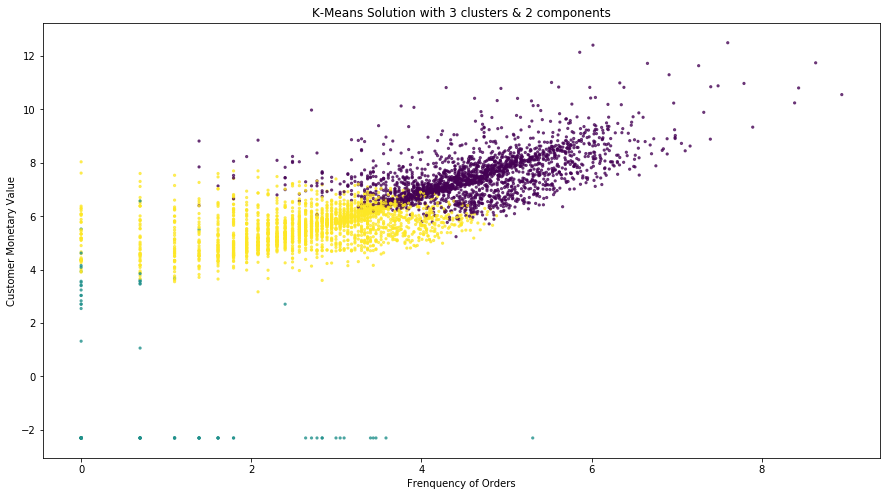

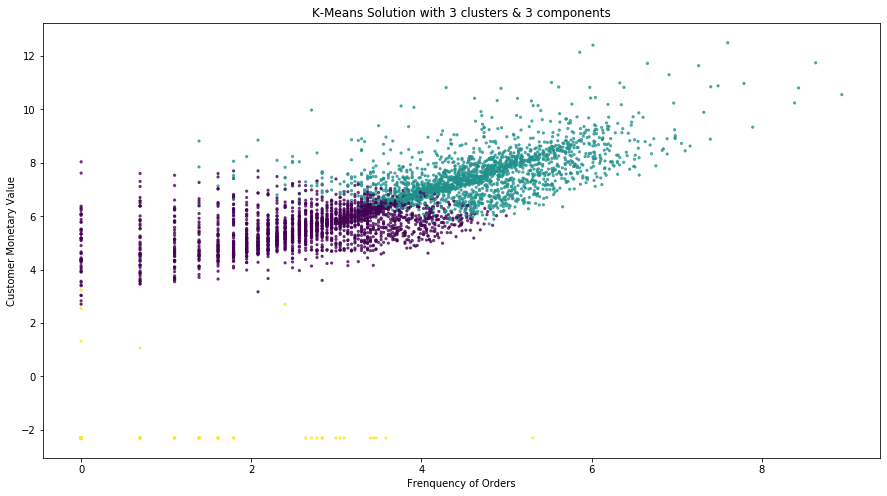

...

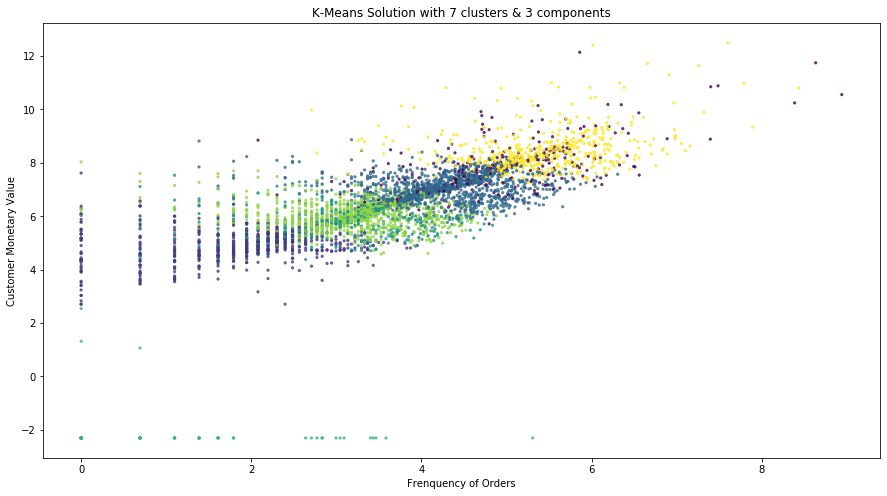

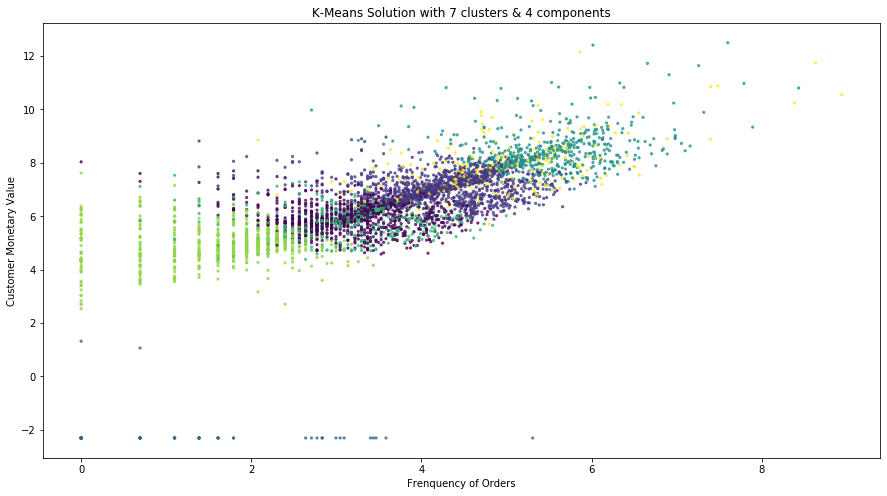

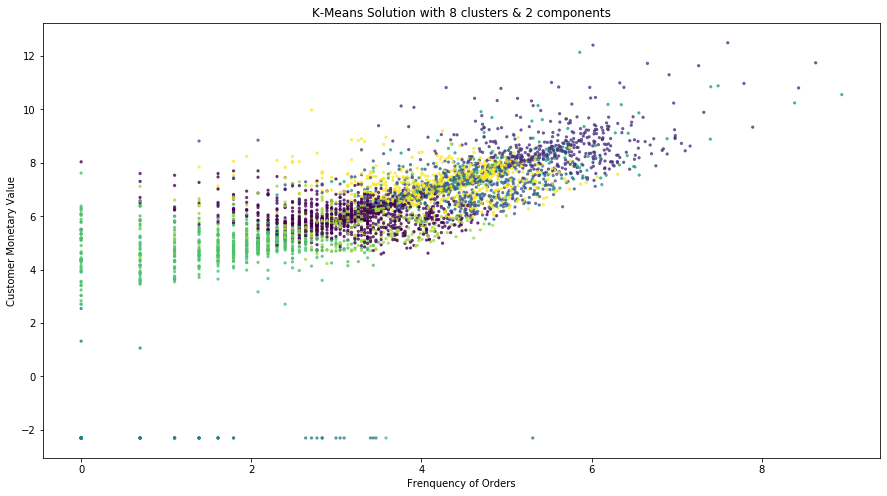

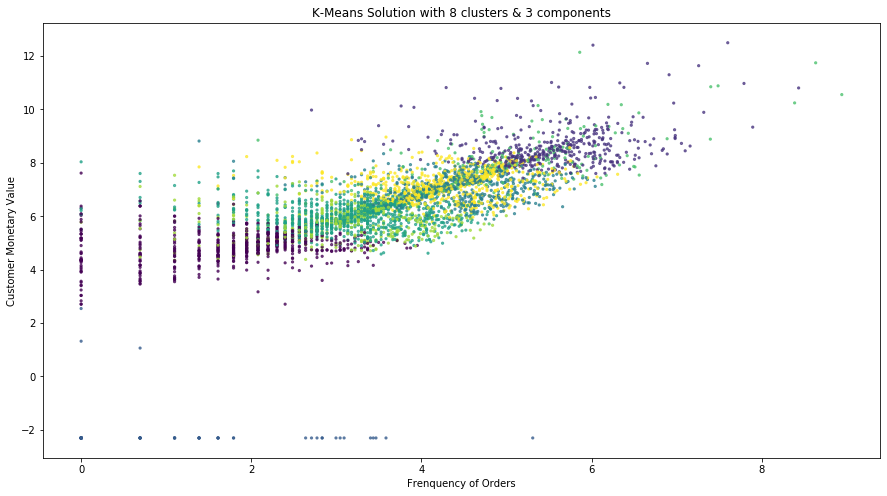

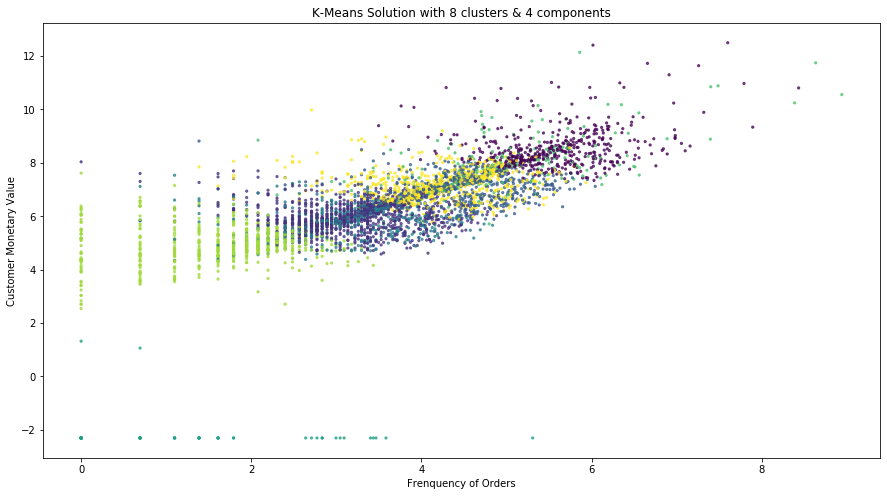

In [115]:
for i in range(2,9):
    for j in range(2,5):

        pipe_kmeans = Pipeline([('scl', StandardScaler()),
                    ('pca', PCA(n_components=j)),  # change value of c for # of PCA components
                    ('clf', KMeans(n_clusters=i, n_jobs = -1, n_init = 100))]) # value of k changes in loop

        pipe_kmeans.fit(log_features)
        cluster_preds = pipe_kmeans.predict(log_features)

        print(f'K-Means Solution with ' + str(i) + ' clusters & ' + str(j) + ' components\n-----------------------')
        print('Calinski-Harabaz (CA) Cluster Variance Ration score: ', calinski_harabasz_score(log_features, cluster_preds))
        print('Cluster Silhouette score: ', metrics.silhouette_score(log_features, cluster_preds))
        print('\n')
        
        plt.figure(figsize=(15, 8))
        plt.title(f'K-Means Solution with ' + str(i) + ' clusters & ' + str(j) + ' components')
        plt.xlabel("Frenquency of Orders")
        plt.ylabel("Customer Monetary Value")
        plt.scatter(log_features.frequency, log_features.monetary, c=cluster_preds, s=5, alpha=.7)

        # merge cluster predicitons to unlogged, unscaled df and print summary stats by cluster
        customer_df['Cluster'] = cluster_preds
        for cluster in set(cluster_preds):
            print(f'Summary Stats for cluster # {cluster}')
            print(customer_df[customer_df['Cluster'] == cluster][['quantity', 'recency', 'frequency', 'monetary']].describe())
            pop_perc = round((len(customer_df[customer_df['Cluster'] == cluster]) / len(customer_df))*100, 2)
            rev_perc = round((sum(customer_df[customer_df['Cluster'] == cluster].monetary) / sum(customer_df.monetary))*100, 2)               
            total_spend = round(sum(customer_df[customer_df['Cluster'] == cluster].monetary), 2)
            print(f'This cluster represents {pop_perc}% of the population and {rev_perc}% of Total Revenue, with a total spend of £{total_spend}')
            print('\n\n\n')
        
            kmeans_sil_current = metrics.silhouette_score(log_features, cluster_preds)
            kmeans_cah_current = calinski_harabasz_score(log_features, cluster_preds)

            if sil_current > kmeans_sil_init:
                kmeans_sil_final_i = i
                kmeans_sil_final_j = j
                kmeans_sil_init = kmeans_sil_current
            else:
                pass

            if cah_current > kmeans_sil_init:
                kmeans_cah_final_i = i
                kmeans_cah_final_j = j
                kmeans_cah_init = kmeans_cah_current
            else:
                pass



In [116]:
print('best performing k-means cluster:')
print(str(kmeans_sil_final_i) + ' clusters')
print(str(kmeans_sil_final_j) + ' components')
print(str(kmeans_sil_init) + ' silhouette score')
print('')
print('best performing k-means cluster:')
print(str(kmeans_cah_final_i) + ' clusters')
print(str(kmeans_cah_final_j) + ' components')
print(str(kmeans_cah_init) + ' CAH score')

best performing k-means cluster:
2 clusters
2 components
0.3750057306690094 silhouette score

best performing k-means cluster:
8 clusters
4 components
2466.470118930243 CAH score


In [137]:
hac_sil_current = 0
hac_ca_current = 0

hac_sil_final_i = 0
hac_sil_final_j = 0
hac_sil_final_m = 0
hac_sil_init = 0

hac_ca_final_i = 0
hac_ca_final_j = 0
hac_ca_final_m = 0
hac_ca_init = 0

linkage_list = ["ward", "complete", "average", "single"]

HAC Solution with 2 clusters & 2 components ward
-----------------------
Calinski-Harabaz (CA) Cluster Variance Ration score:  2857.6974640493117
Cluster Silhouette score:  0.37363370731778783


Summary Stats for cluster # 0
           quantity      recency    frequency     monetary
count   2258.000000  2258.000000  2258.000000  2258.000000
mean     199.069531   137.170505    22.837910   338.539278
std      330.494412   110.351630    19.474358   286.636347
min     -303.000000     0.000000     1.000000 -4287.630000
25%       85.000000    38.000000     9.000000   167.752500
50%      156.000000   111.000000    18.000000   300.390000
75%      258.000000   230.000000    30.000000   453.007500
max    12540.000000   365.000000   202.000000  3096.000000
This cluster represents 52.1% of the population and 9.55% of Total Revenue, with a total spend of £764421.69




Summary Stats for cluster # 1
            quantity      recency    frequency       monetary
count    2076.000000  2076.000000  2076

Summary Stats for cluster # 1
            quantity      recency    frequency       monetary
count    2076.000000  2076.000000  2076.000000    2076.000000
mean     2060.781310    39.167148   163.692678    3485.983011
std      6386.072526    50.204301   303.873436   11272.052128
min       170.000000     0.000000     4.000000     303.090000
25%       573.000000     8.000000    60.000000     995.032500
50%       962.500000    21.000000   101.500000    1616.270000
75%      1784.500000    52.000000   177.000000    3002.537500
max    188761.000000   358.000000  7637.000000  267761.000000
This cluster represents 47.9% of the population and 90.45% of Total Revenue, with a total spend of £7236900.73




HAC Solution with 2 clusters & 3 components average
-----------------------
Calinski-Harabaz (CA) Cluster Variance Ration score:  899.3562689179729
Cluster Silhouette score:  0.7065114583916643


Summary Stats for cluster # 0
            quantity      recency    frequency       monetary
count    

HAC Solution with 2 clusters & 4 components single
-----------------------
Calinski-Harabaz (CA) Cluster Variance Ration score:  2857.6974640493117
Cluster Silhouette score:  0.37363370731778783


Summary Stats for cluster # 0
           quantity      recency    frequency     monetary
count   2258.000000  2258.000000  2258.000000  2258.000000
mean     199.069531   137.170505    22.837910   338.539278
std      330.494412   110.351630    19.474358   286.636347
min     -303.000000     0.000000     1.000000 -4287.630000
25%       85.000000    38.000000     9.000000   167.752500
50%      156.000000   111.000000    18.000000   300.390000
75%      258.000000   230.000000    30.000000   453.007500
max    12540.000000   365.000000   202.000000  3096.000000
This cluster represents 52.1% of the population and 9.55% of Total Revenue, with a total spend of £764421.69




Summary Stats for cluster # 1
            quantity      recency    frequency       monetary
count    2076.000000  2076.000000  20

Cluster Silhouette score:  0.4998481955609859


Summary Stats for cluster # 0
            quantity      recency    frequency       monetary
count    4282.000000  4282.000000  4282.000000    4282.000000
mean     1104.497431    88.540168    91.280243    1871.654463
std      4548.035110    98.105690   223.340093    8004.508943
min         0.000000     0.000000     1.000000     -43.400000
25%       155.000000    14.000000    17.000000     298.975000
50%       365.000000    45.000000    41.000000     647.160000
75%       944.750000   140.750000   100.000000    1583.050000
max    188761.000000   365.000000  7637.000000  267761.000000
This cluster represents 98.8% of the population and 100.16% of Total Revenue, with a total spend of £8014424.41




Summary Stats for cluster # 1
         quantity     recency   frequency     monetary
count   51.000000   51.000000   51.000000    51.000000
mean   -35.470588  233.588235   10.333333  -258.486078
std     74.855154  128.910694   28.677982   679.88460

HAC Solution with 3 clusters & 3 components single
-----------------------
Calinski-Harabaz (CA) Cluster Variance Ration score:  481.42803232513927
Cluster Silhouette score:  0.44107764900208957


Summary Stats for cluster # 0
            quantity      recency    frequency       monetary
count    4271.000000  4271.000000  4271.000000    4271.000000
mean     1106.903301    88.768204    91.471318    1875.679857
std      4553.640913    98.128863   223.595520    8014.416654
min         0.000000     0.000000     1.000000     -43.400000
25%       155.500000    15.000000    17.000000     299.450000
50%       367.000000    46.000000    42.000000     648.690000
75%       949.000000   141.000000   100.000000    1588.515000
max    188761.000000   365.000000  7637.000000  267761.000000
This cluster represents 98.55% of the population and 100.12% of Total Revenue, with a total spend of £8011028.67




Summary Stats for cluster # 1
         quantity     recency   frequency     monetary
count   51.00

HAC Solution with 3 clusters & 4 components single
-----------------------
Calinski-Harabaz (CA) Cluster Variance Ration score:  2414.591531822372
Cluster Silhouette score:  0.3857749401288108


Summary Stats for cluster # 0
         quantity     recency   frequency     monetary
count   51.000000   51.000000   51.000000    51.000000
mean   -35.470588  233.588235   10.333333  -258.486078
std     74.855154  128.910694   28.677982   679.884607
min   -303.000000    9.000000    1.000000 -4287.630000
25%    -17.500000  130.000000    1.000000  -123.575000
50%     -1.000000  293.000000    3.000000   -29.950000
75%     -1.000000  351.500000    5.500000    -2.750000
max      2.000000  364.000000  202.000000     0.000000
This cluster represents 1.18% of the population and -0.16% of Total Revenue, with a total spend of £-13182.79




Summary Stats for cluster # 1
            quantity      recency    frequency       monetary
count    2076.000000  2076.000000  2076.000000    2076.000000
mean     206

Summary Stats for cluster # 1
           quantity  recency    frequency       monetary
count    137.000000    137.0   137.000000     137.000000
mean    4329.459854      0.0   335.262774    7487.754234
std    10622.016092      0.0   897.559995   20414.078390
min      193.000000      0.0    10.000000     303.090000
25%      693.000000      0.0    71.000000    1379.750000
50%     1505.000000      0.0   137.000000    2597.520000
75%     2915.000000      0.0   259.000000    4940.820000
max    73623.000000      0.0  7637.000000  187482.170000
This cluster represents 3.16% of the population and 12.82% of Total Revenue, with a total spend of £1025822.33




Summary Stats for cluster # 2
       quantity  recency  frequency  monetary
count       1.0      1.0        1.0       1.0
mean   188761.0      8.0     1999.0  267761.0
std         NaN      NaN        NaN       NaN
min    188761.0      8.0     1999.0  267761.0
25%    188761.0      8.0     1999.0  267761.0
50%    188761.0      8.0     1999.0 

Summary Stats for cluster # 1
           quantity      recency    frequency      monetary
count   2057.000000  2057.000000  2057.000000   2057.000000
mean    1617.182790    39.494409   147.061254   2688.517569
std     2418.566245    50.317292   156.969628   3734.928429
min      170.000000     0.000000     4.000000    303.090000
25%      571.000000     8.000000    59.000000    991.850000
50%      954.000000    22.000000   101.000000   1604.440000
75%     1755.000000    52.000000   174.000000   2948.220000
max    32592.000000   358.000000  2681.000000  50992.610000
This cluster represents 47.46% of the population and 69.12% of Total Revenue, with a total spend of £5530280.64




Summary Stats for cluster # 2
         quantity     recency   frequency     monetary
count   71.000000   71.000000   71.000000    71.000000
mean   -22.985915  215.169014    8.633803  -166.480141
std     66.859446  122.453605   24.731841   599.349385
min   -303.000000    9.000000    1.000000 -4287.630000
25%     -

Summary Stats for cluster # 1
            quantity     recency    frequency       monetary
count     588.000000  588.000000   588.000000     588.000000
mean     4902.853741   14.134354   336.909864    8480.420663
std     11438.523738   17.232076   523.590976   20272.593593
min       193.000000    0.000000    10.000000     303.090000
25%      1676.250000    1.000000   150.000000    2965.065000
50%      2409.000000    8.000000   229.000000    4132.650000
75%      4025.500000   22.000000   370.250000    6814.312500
max    188761.000000   92.000000  7637.000000  267761.000000
This cluster represents 13.57% of the population and 62.32% of Total Revenue, with a total spend of £4986487.35




Summary Stats for cluster # 2
         quantity     recency   frequency     monetary
count   51.000000   51.000000   51.000000    51.000000
mean   -35.470588  233.588235   10.333333  -258.486078
std     74.855154  128.910694   28.677982   679.884607
min   -303.000000    9.000000    1.000000 -4287.630000


Summary Stats for cluster # 1
         quantity     recency  frequency     monetary
count   50.000000   50.000000  50.000000    50.000000
mean   -36.180000  237.260000   6.500000  -263.655800
std     75.441744  127.497068   8.631338   685.773846
min   -303.000000    9.000000   1.000000 -4287.630000
25%    -20.250000  134.250000   1.000000  -129.187500
50%     -1.500000  293.000000   2.500000   -30.070000
75%     -1.000000  351.750000   5.000000    -3.150000
max      2.000000  364.000000  32.000000     0.000000
This cluster represents 1.15% of the population and -0.16% of Total Revenue, with a total spend of £-13182.79




Summary Stats for cluster # 2
           quantity      recency    frequency     monetary
count   2207.000000  2207.000000  2207.000000  2207.000000
mean     204.489352   134.942456    23.126869   352.335514
std      332.149980   108.914964    19.122742   255.248961
min        0.000000     0.000000     1.000000   -43.400000
25%       89.000000    36.500000    10.000000

Summary Stats for cluster # 4
         quantity     recency   frequency     monetary
count  296.000000  296.000000  296.000000   296.000000
mean   202.084459    8.699324   29.530405   363.674966
std    111.860459    5.887142   21.968678   210.206395
min     17.000000    0.000000    2.000000    77.400000
25%    119.000000    3.000000   14.000000   213.915000
50%    183.000000    9.000000   24.000000   323.200000
75%    256.000000   13.000000   38.000000   460.777500
max    842.000000   28.000000  148.000000  1463.040000
This cluster represents 6.83% of the population and 1.35% of Total Revenue, with a total spend of £107647.79




HAC Solution with 5 clusters & 2 components average
-----------------------
Calinski-Harabaz (CA) Cluster Variance Ration score:  1702.020166687021
Cluster Silhouette score:  0.37678855556512475


Summary Stats for cluster # 0
           quantity      recency    frequency     monetary
count   2207.000000  2207.000000  2207.000000  2207.000000
mean     204.4893

Summary Stats for cluster # 1
            quantity     recency    frequency       monetary
count     535.000000  535.000000   535.000000     535.000000
mean     5160.186916   36.218692   329.441121    8771.973664
std     11874.305345   45.559062   543.996175   21127.832744
min       820.000000    0.000000     4.000000    1133.070000
25%      1736.000000    9.000000   137.500000    2949.435000
50%      2470.000000   21.000000   216.000000    4098.800000
75%      4292.500000   45.000000   356.500000    6826.435000
max    188761.000000  307.000000  7637.000000  267761.000000
This cluster represents 12.34% of the population and 58.65% of Total Revenue, with a total spend of £4693005.91




Summary Stats for cluster # 2
         quantity     recency   frequency     monetary
count   51.000000   51.000000   51.000000    51.000000
mean   -35.470588  233.588235   10.333333  -258.486078
std     74.855154  128.910694   28.677982   679.884607
min   -303.000000    9.000000    1.000000 -4287.630000


Summary Stats for cluster # 3
         quantity     recency   frequency     monetary
count   51.000000   51.000000   51.000000    51.000000
mean   -35.470588  233.588235   10.333333  -258.486078
std     74.855154  128.910694   28.677982   679.884607
min   -303.000000    9.000000    1.000000 -4287.630000
25%    -17.500000  130.000000    1.000000  -123.575000
50%     -1.000000  293.000000    3.000000   -29.950000
75%     -1.000000  351.500000    5.500000    -2.750000
max      2.000000  364.000000  202.000000     0.000000
This cluster represents 1.18% of the population and -0.16% of Total Revenue, with a total spend of £-13182.79




Summary Stats for cluster # 4
          quantity  recency    frequency      monetary
count   125.000000    125.0   125.000000    125.000000
mean   1766.312000      0.0   178.424000   3250.577120
std    1571.840304      0.0   195.339005   2944.438927
min     193.000000      0.0    10.000000    303.090000
25%     641.000000      0.0    66.000000   1290.010000
5

Cluster Silhouette score:  0.13417849439796795


Summary Stats for cluster # 0
         quantity     recency   frequency     monetary
count   75.000000   75.000000   75.000000    75.000000
mean   -21.360000  223.186667    8.560000  -154.866667
std     65.397049  117.449666   24.063115   584.999509
min   -303.000000    9.000000    1.000000 -4287.630000
25%     -5.000000  135.000000    1.000000   -60.780000
50%     -1.000000  253.000000    2.000000    -3.750000
75%      2.000000  337.500000    5.500000    13.875000
max     59.000000  364.000000  202.000000   715.500000
This cluster represents 1.73% of the population and -0.15% of Total Revenue, with a total spend of £-11615.0




Summary Stats for cluster # 1
           quantity      recency    frequency      monetary
count   1634.000000  1634.000000  1634.000000   1634.000000
mean    1735.927173    35.579559   170.405141   2943.333244
std     2465.931993    51.201858   149.612534   3942.097970
min      170.000000     0.000000    10.0000

Summary Stats for cluster # 2
           quantity      recency    frequency     monetary
count   2207.000000  2207.000000  2207.000000  2207.000000
mean     204.489352   134.942456    23.126869   352.335514
std      332.149980   108.914964    19.122742   255.248961
min        0.000000     0.000000     1.000000   -43.400000
25%       89.000000    36.500000    10.000000   175.235000
50%      160.000000   108.000000    19.000000   305.020000
75%      260.000000   226.500000    30.000000   457.405000
max    12540.000000   365.000000   148.000000  3096.000000
This cluster represents 50.92% of the population and 9.72% of Total Revenue, with a total spend of £777604.48




Summary Stats for cluster # 3
       quantity  recency  frequency  monetary
count       1.0      1.0        1.0       1.0
mean        0.0     50.0      202.0       0.0
std         NaN      NaN        NaN       NaN
min         0.0     50.0      202.0       0.0
25%         0.0     50.0      202.0       0.0
50%         0.0    

Summary Stats for cluster # 3
          quantity     recency   frequency     monetary
count   982.000000  982.000000  982.000000   982.000000
mean    860.486762   15.693483  104.568228  1485.166721
std     580.766536   15.147617   76.481420  1020.306352
min     170.000000    0.000000    4.000000   303.090000
25%     465.250000    3.000000   53.000000   781.987500
50%     689.500000   11.000000   84.000000  1152.445000
75%    1090.750000   22.000000  132.000000  1837.022500
max    5256.000000   69.000000  547.000000  7276.900000
This cluster represents 22.66% of the population and 18.23% of Total Revenue, with a total spend of £1458433.72




Summary Stats for cluster # 4
         quantity     recency   frequency     monetary
count  296.000000  296.000000  296.000000   296.000000
mean   202.084459    8.699324   29.530405   363.674966
std    111.860459    5.887142   21.968678   210.206395
min     17.000000    0.000000    2.000000    77.400000
25%    119.000000    3.000000   14.000000   2

Summary Stats for cluster # 4
         quantity     recency   frequency     monetary
count   51.000000   51.000000   51.000000    51.000000
mean   -35.470588  233.588235   10.333333  -258.486078
std     74.855154  128.910694   28.677982   679.884607
min   -303.000000    9.000000    1.000000 -4287.630000
25%    -17.500000  130.000000    1.000000  -123.575000
50%     -1.000000  293.000000    3.000000   -29.950000
75%     -1.000000  351.500000    5.500000    -2.750000
max      2.000000  364.000000  202.000000     0.000000
This cluster represents 1.18% of the population and -0.16% of Total Revenue, with a total spend of £-13182.79




Summary Stats for cluster # 5
       quantity  recency  frequency  monetary
count       1.0      1.0        1.0       1.0
mean   188761.0      8.0     1999.0  267761.0
std         NaN      NaN        NaN       NaN
min    188761.0      8.0     1999.0  267761.0
25%    188761.0      8.0     1999.0  267761.0
50%    188761.0      8.0     1999.0  267761.0
75%    18

Summary Stats for cluster # 4
         quantity     recency   frequency     monetary
count  110.000000  110.000000  110.000000   110.000000
mean   193.800000    2.609091   27.872727   382.613182
std    110.555877    2.116321   24.616735   235.747680
min     32.000000    0.000000    2.000000    77.400000
25%    113.250000    1.000000   13.000000   218.547500
50%    177.500000    2.000000   20.000000   330.365000
75%    244.500000    3.000000   35.000000   462.585000
max    723.000000    9.000000  148.000000  1463.040000
This cluster represents 2.54% of the population and 0.53% of Total Revenue, with a total spend of £42087.45




Summary Stats for cluster # 5
           quantity      recency    frequency      monetary
count   1660.000000  1660.000000  1660.000000   1660.000000
mean    1476.579518    48.548193   131.530120   2402.862717
std     2329.554132    52.076803   126.851076   3467.289182
min      170.000000     6.000000     4.000000    320.720000
25%      552.000000    15.000000 

Summary Stats for cluster # 4
       quantity  recency  frequency  monetary
count       1.0      1.0        1.0      1.00
mean        2.0     36.0        3.0     -8.15
std         NaN      NaN        NaN       NaN
min         2.0     36.0        3.0     -8.15
25%         2.0     36.0        3.0     -8.15
50%         2.0     36.0        3.0     -8.15
75%         2.0     36.0        3.0     -8.15
max         2.0     36.0        3.0     -8.15
This cluster represents 0.02% of the population and -0.0% of Total Revenue, with a total spend of £-8.15




Summary Stats for cluster # 5
       quantity  recency  frequency  monetary
count       1.0      1.0        1.0       1.0
mean       32.0      0.0        5.0      80.8
std         NaN      NaN        NaN       NaN
min        32.0      0.0        5.0      80.8
25%        32.0      0.0        5.0      80.8
50%        32.0      0.0        5.0      80.8
75%        32.0      0.0        5.0      80.8
max        32.0      0.0        5.0      80.8
Thi

Summary Stats for cluster # 5
        quantity     recency  frequency    monetary
count  23.000000   23.000000  23.000000   23.000000
mean    7.000000  203.434783   3.434783   68.164783
std    11.920189   87.799786   3.087012  150.271589
min     0.000000   43.000000   1.000000  -43.400000
25%     2.000000  151.500000   1.000000   15.000000
50%     4.000000  203.000000   2.000000   32.650000
75%     7.500000  268.500000   4.500000   43.350000
max    59.000000  363.000000  11.000000  715.500000
This cluster represents 0.53% of the population and 0.02% of Total Revenue, with a total spend of £1567.79




HAC Solution with 6 clusters & 4 components average
-----------------------
Calinski-Harabaz (CA) Cluster Variance Ration score:  1174.8909622516423
Cluster Silhouette score:  0.32618062362504596


Summary Stats for cluster # 0
           quantity      recency    frequency      monetary
count   2045.000000  2045.000000  2045.000000   2045.000000
mean    1502.058191    39.652812   144.8239

HAC Solution with 7 clusters & 2 components ward
-----------------------
Calinski-Harabaz (CA) Cluster Variance Ration score:  2355.848111660381
Cluster Silhouette score:  0.25641398905007073


Summary Stats for cluster # 0
            quantity     recency    frequency       monetary
count     403.000000  403.000000   403.000000     403.000000
mean     4347.027295    1.565757   290.054591    7648.889628
std     13447.874776    1.815499   622.652349   24062.563190
min       184.000000    0.000000     8.000000     303.090000
25%       706.500000    0.000000    83.000000    1269.145000
50%      1387.000000    1.000000   146.000000    2459.330000
75%      2642.500000    3.000000   278.000000    4633.155000
max    188761.000000   17.000000  7637.000000  267761.000000
This cluster represents 9.3% of the population and 38.52% of Total Revenue, with a total spend of £3082502.52




Summary Stats for cluster # 1
          quantity      recency    frequency     monetary
count  1193.000000  1193.

Summary Stats for cluster # 5
         quantity     recency   frequency     monetary
count   51.000000   51.000000   51.000000    51.000000
mean   -35.470588  233.588235   10.333333  -258.486078
std     74.855154  128.910694   28.677982   679.884607
min   -303.000000    9.000000    1.000000 -4287.630000
25%    -17.500000  130.000000    1.000000  -123.575000
50%     -1.000000  293.000000    3.000000   -29.950000
75%     -1.000000  351.500000    5.500000    -2.750000
max      2.000000  364.000000  202.000000     0.000000
This cluster represents 1.18% of the population and -0.16% of Total Revenue, with a total spend of £-13182.79




Summary Stats for cluster # 6
          quantity      recency    frequency     monetary
count  1553.000000  1553.000000  1553.000000  1553.000000
mean    227.853831   168.226658    25.314231   395.128480
std     225.853447   101.253033    18.764525   262.019592
min      17.000000    17.000000     1.000000    58.080000
25%     113.000000    71.000000    12.000

Summary Stats for cluster # 4
         quantity     recency   frequency     monetary
count   51.000000   51.000000   51.000000    51.000000
mean   -35.470588  233.588235   10.333333  -258.486078
std     74.855154  128.910694   28.677982   679.884607
min   -303.000000    9.000000    1.000000 -4287.630000
25%    -17.500000  130.000000    1.000000  -123.575000
50%     -1.000000  293.000000    3.000000   -29.950000
75%     -1.000000  351.500000    5.500000    -2.750000
max      2.000000  364.000000  202.000000     0.000000
This cluster represents 1.18% of the population and -0.16% of Total Revenue, with a total spend of £-13182.79




Summary Stats for cluster # 5
       quantity  recency  frequency  monetary
count       1.0      1.0        1.0       1.0
mean   188761.0      8.0     1999.0  267761.0
std         NaN      NaN        NaN       NaN
min    188761.0      8.0     1999.0  267761.0
25%    188761.0      8.0     1999.0  267761.0
50%    188761.0      8.0     1999.0  267761.0
75%    18

Summary Stats for cluster # 3
            quantity    recency    frequency       monetary
count      19.000000  19.000000    19.000000      19.000000
mean    50086.157895   3.736842  1964.263158   89822.110000
std     39699.509274   5.086388  2092.006210   71505.411905
min     12593.000000   0.000000   252.000000   27980.330000
25%     22913.000000   0.000000   492.000000   49809.125000
50%     44658.000000   2.000000  1059.000000   58352.770000
75%     60393.500000   3.000000  2209.000000  118554.795000
max    188761.000000  17.000000  7637.000000  267761.000000
This cluster represents 0.44% of the population and 21.33% of Total Revenue, with a total spend of £1706620.09




Summary Stats for cluster # 4
         quantity     recency   frequency     monetary
count   51.000000   51.000000   51.000000    51.000000
mean   -35.470588  233.588235   10.333333  -258.486078
std     74.855154  128.910694   28.677982   679.884607
min   -303.000000    9.000000    1.000000 -4287.630000
25%    -17

Summary Stats for cluster # 1
           quantity  recency    frequency       monetary
count    137.000000    137.0   137.000000     137.000000
mean    4329.459854      0.0   335.262774    7487.754234
std    10622.016092      0.0   897.559995   20414.078390
min      193.000000      0.0    10.000000     303.090000
25%      693.000000      0.0    71.000000    1379.750000
50%     1505.000000      0.0   137.000000    2597.520000
75%     2915.000000      0.0   259.000000    4940.820000
max    73623.000000      0.0  7637.000000  187482.170000
This cluster represents 3.16% of the population and 12.82% of Total Revenue, with a total spend of £1025822.33




Summary Stats for cluster # 2
         quantity     recency   frequency     monetary
count   50.000000   50.000000   50.000000    50.000000
mean   -36.220000  237.540000   10.480000  -263.492800
std     75.421615  127.060681   28.949809   685.836782
min   -303.000000    9.000000    1.000000 -4287.630000
25%    -20.250000  134.250000    1.00

HAC Solution with 7 clusters & 4 components complete
-----------------------
Calinski-Harabaz (CA) Cluster Variance Ration score:  1374.0030415058989
Cluster Silhouette score:  0.15569759720837462


Summary Stats for cluster # 0
           quantity      recency    frequency     monetary
count   2175.000000  2175.000000  2175.000000  2175.000000
mean     200.825747   134.265747    23.405977   351.498464
std      306.302027   108.921890    19.107652   241.037345
min        1.000000     0.000000     1.000000     0.000000
25%       91.000000    36.000000    10.000000   178.610000
50%      160.000000   106.000000    19.000000   306.450000
75%      260.000000   226.000000    30.000000   457.405000
max    12540.000000   365.000000   148.000000  2207.400000
This cluster represents 50.18% of the population and 9.55% of Total Revenue, with a total spend of £764509.16




Summary Stats for cluster # 1
           quantity     recency   frequency      monetary
count    427.000000  427.000000  427.0

Summary Stats for cluster # 5
          quantity      recency    frequency     monetary
count  2158.000000  2158.000000  2158.000000  2158.000000
mean    202.252085   134.900371    23.516219   357.426432
std     203.993558   108.517040    19.118338   254.673484
min       1.000000     1.000000     1.000000    23.800000
25%      92.250000    37.000000    10.000000   180.162500
50%     161.000000   108.000000    19.000000   307.625000
75%     264.000000   226.000000    30.750000   459.722500
max    4300.000000   365.000000   148.000000  3096.000000
This cluster represents 49.79% of the population and 9.64% of Total Revenue, with a total spend of £771326.24




Summary Stats for cluster # 6
           quantity  recency    frequency      monetary
count    131.000000    131.0   131.000000    131.000000
mean    2428.641221      0.0   187.152672   4127.212977
std     3614.992204      0.0   201.092037   5012.258326
min      193.000000      0.0    10.000000    303.090000
25%      678.500000     

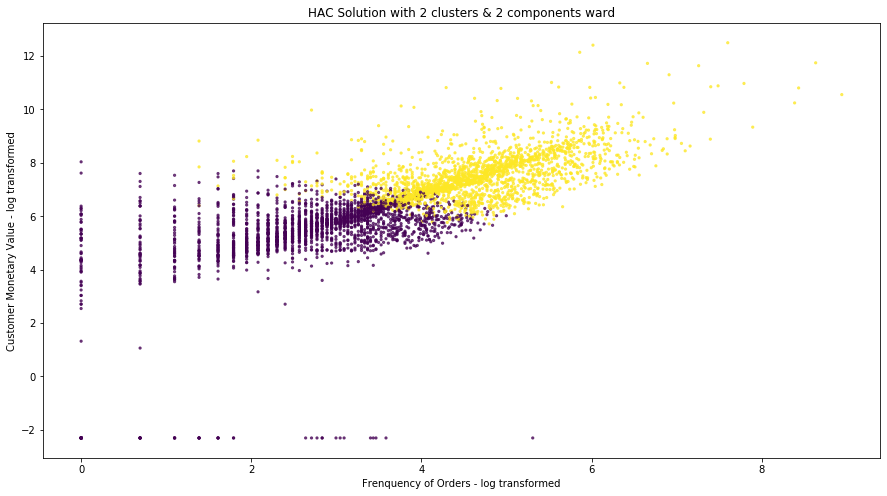

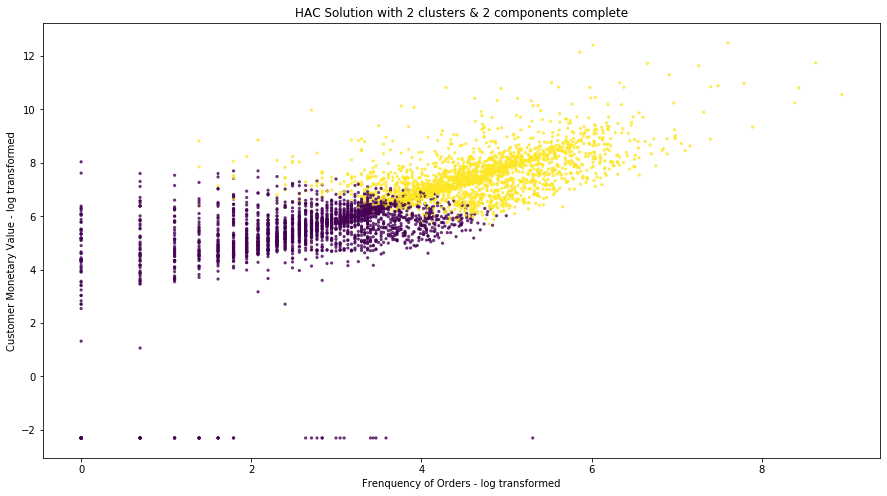

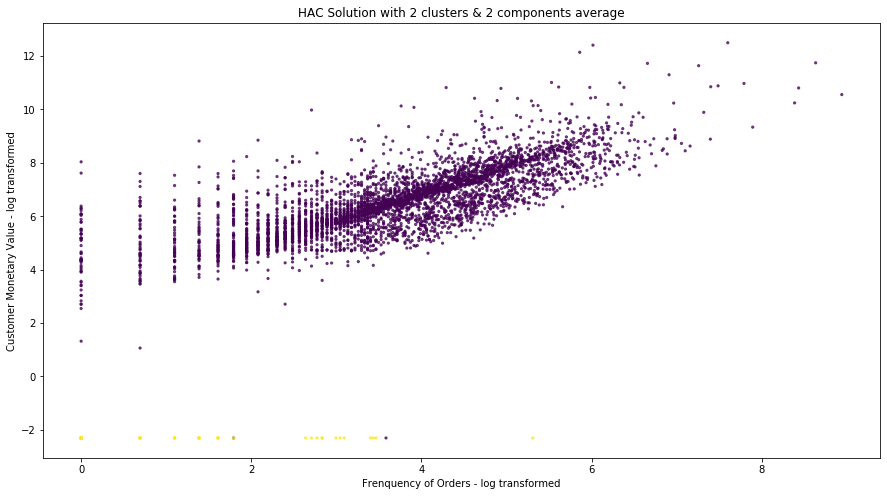

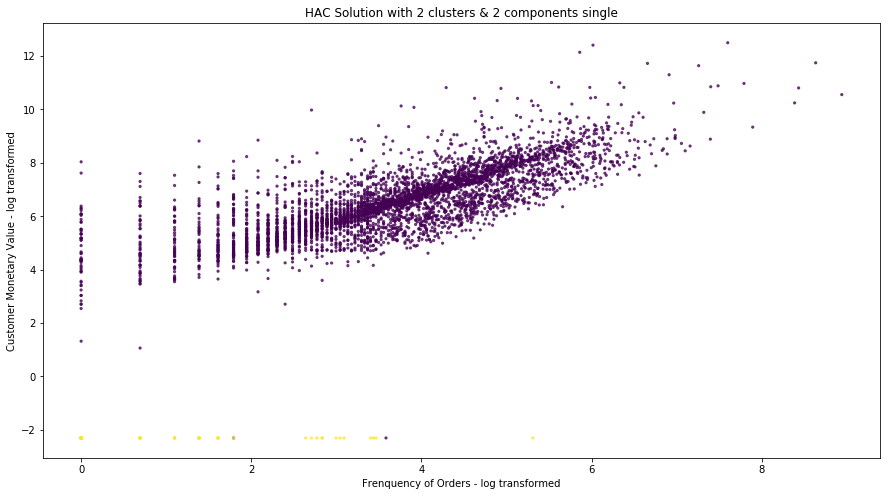

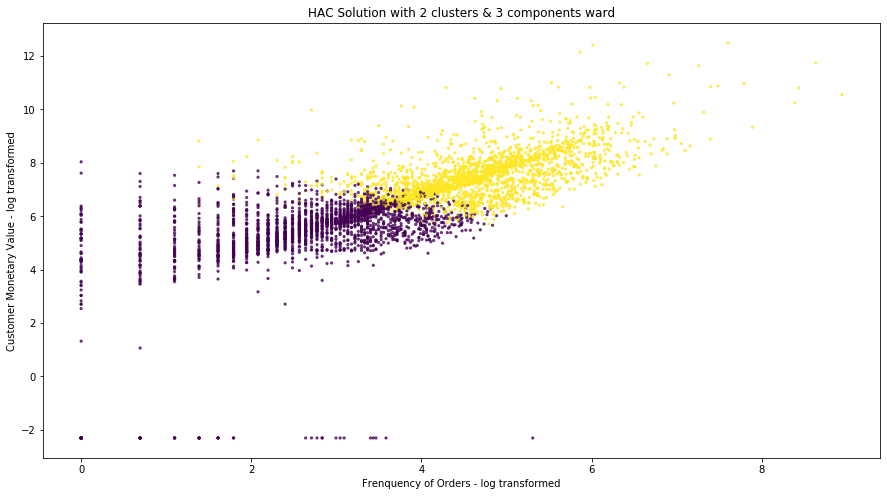

...

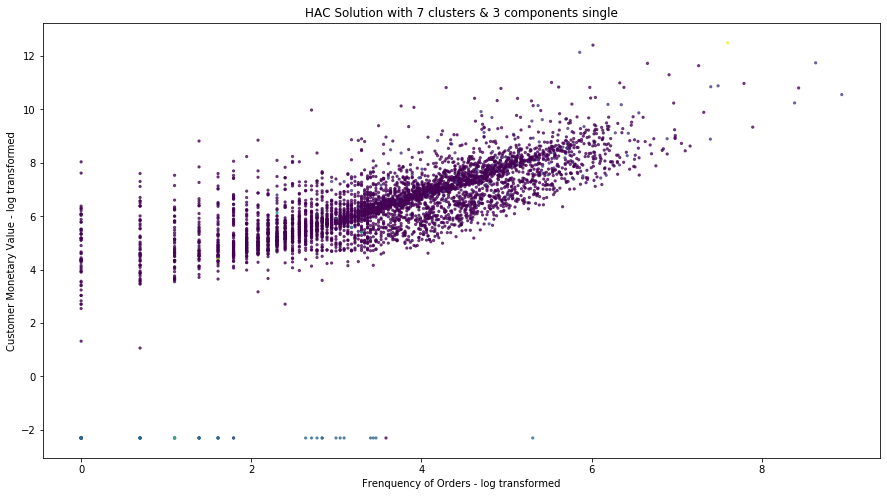

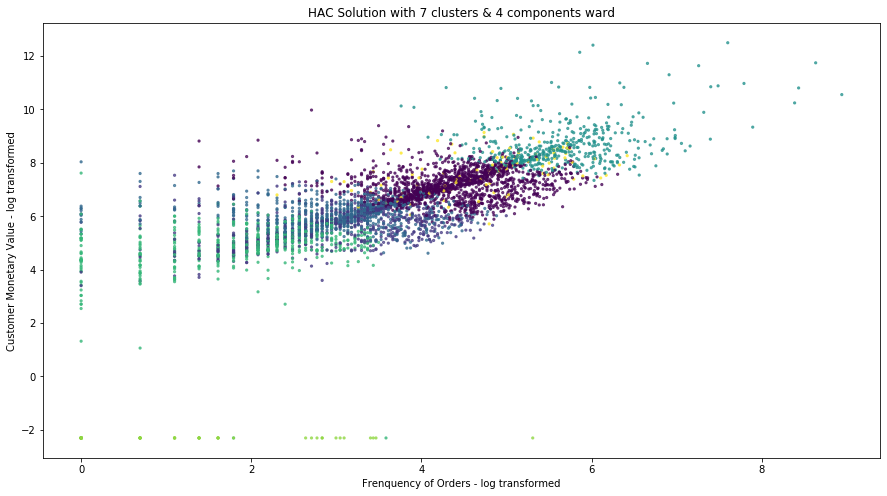

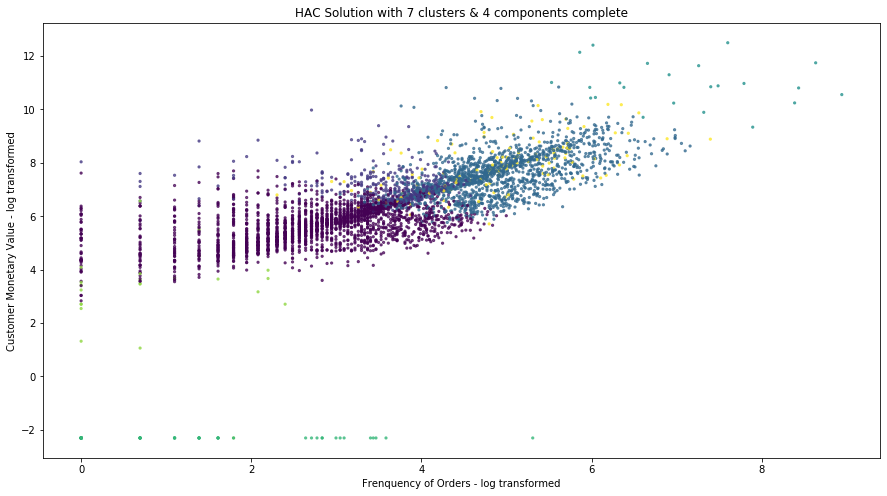

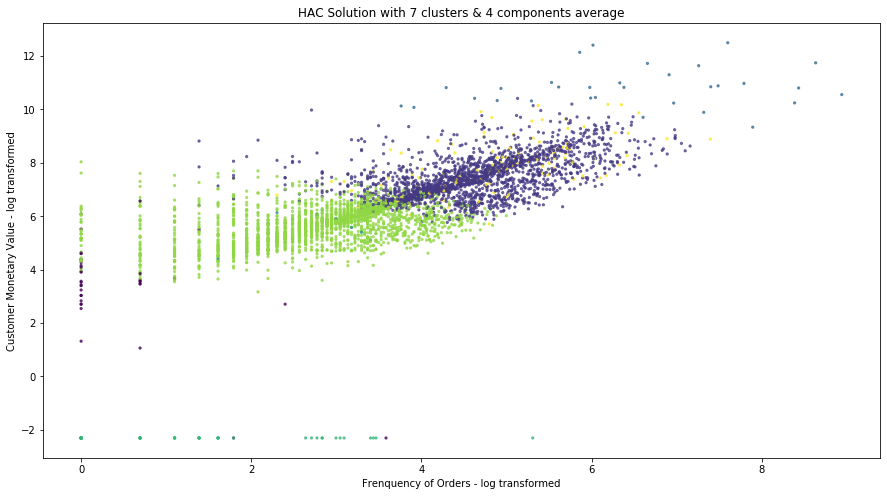

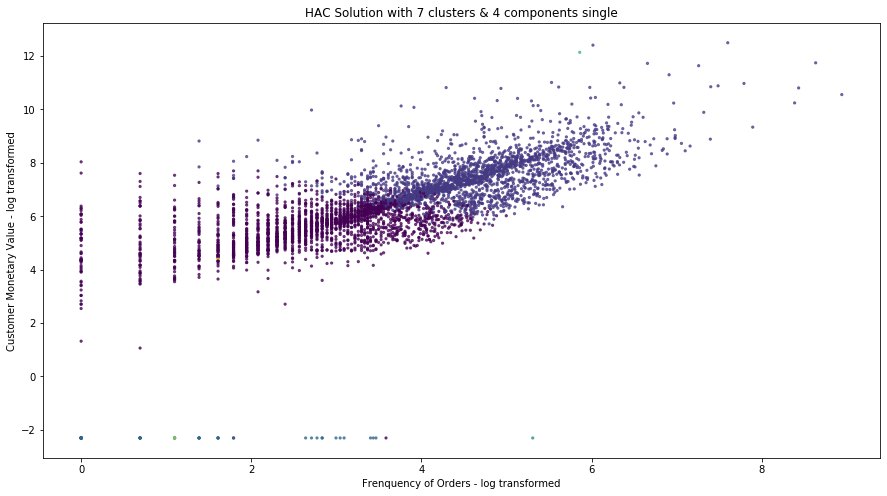

In [139]:
for i in range(2,8):
    for j in range(2,5):
        for m in range(0,4):

            pipe_HAC = Pipeline([('scl', StandardScaler()),
                        ('pca', PCA(n_components=j)), # see above
                        ('clf', AgglomerativeClustering(n_clusters=i, linkage = linkage_list[m]),
                        )]) # see above

            pipe_HAC.fit(log_features)
            cluster_preds = pipe_HAC.fit_predict(log_features)

            print(f'HAC Solution with ' + str(i) + ' clusters & ' + str(j) + ' components ' + linkage_list[m] + '\n-----------------------')
            print('Calinski-Harabaz (CA) Cluster Variance Ration score: ', calinski_harabasz_score(log_features, cluster_preds))
            print('Cluster Silhouette score: ', metrics.silhouette_score(log_features, cluster_preds))
            print('\n')

            plt.figure(figsize=(15, 8))
            plt.title(f'HAC Solution with ' + str(i) + ' clusters & ' + str(j) + ' components ' + linkage_list[m])
            plt.xlabel("Frenquency of Orders - log transformed")
            plt.ylabel("Customer Monetary Value - log transformed")
            plt.scatter(log_features.frequency, log_features.monetary, c=cluster_preds, s=5, alpha=.7)

            # merge cluster predicitons to unlogged, unscaled df and print summary stats by cluster
            customer_df['Cluster'] = cluster_preds
            for cluster in set(cluster_preds):
                print(f'Summary Stats for cluster # {cluster}')
                print(customer_df[customer_df['Cluster'] == cluster][['quantity', 'recency', 'frequency', 'monetary']].describe())
                pop_perc = round((len(customer_df[customer_df['Cluster'] == cluster]) / len(customer_df))*100, 2)
                rev_perc = round((sum(customer_df[customer_df['Cluster'] == cluster].monetary) / sum(customer_df.monetary))*100, 2)               
                total_spend = round(sum(customer_df[customer_df['Cluster'] == cluster].monetary), 2)
                print(f'This cluster represents {pop_perc}% of the population and {rev_perc}% of Total Revenue, with a total spend of £{total_spend}')
                print('\n\n\n')

                hac_sil_init = metrics.silhouette_score(log_features, cluster_preds)
                hac_ca_init = calinski_harabasz_score(log_features, cluster_preds)

                if hac_sil_init > hac_sil_current:
                    hac_sil_final_i = i
                    hac_sil_final_j = j
                    hac_sil_final_m = m
                    hac_sil_current = hac_sil_init
                else:
                    pass

                if hac_ca_init > hac_ca_current:
                    hac_ca_final_i = i
                    hac_ca_final_j = j
                    hac_ca_final_m = m
                    hac_ca_current = hac_ca_init
                else:
                    pass



In [140]:
print('best performing k-means cluster:')
print(str(hac_sil_final_i) + ' clusters')
print(str(hac_sil_final_j) + ' components')
print(str(hac_sil_final_m) + ' linkage')
print(str(hac_sil_init) + ' silhouette score')

print('')

print('best performing k-means cluster:')
print(str(hac_ca_final_i) + ' clusters')
print(str(hac_ca_final_j) + ' components')
print(str(hac_ca_final_m) + ' linkage')
print(str(hac_ca_init) + ' CAH score')

best performing k-means cluster:
2 clusters
2 components
2 linkage
0.3550745973128685 silhouette score

best performing k-means cluster:
2 clusters
2 components
0 linkage
814.4653420930493 CAH score


# The Elbow Plot Indicates 6 is the Right Number of Clusters

K-Means Solution with 6 clusters & 2 components
-----------------------
Calinski-Harabaz (CA) Cluster Variance Ration score:  2464.4950003013264
Cluster Silhouette score:  0.297934581428221


Summary Stats for cluster # 0
         quantity     recency   frequency     monetary
count  508.000000  508.000000  508.000000   508.000000
mean   190.984252   16.444882   27.911417   350.020059
std    106.046563   11.472070   20.579811   203.786396
min     17.000000    0.000000    2.000000    68.840000
25%    116.000000    7.000000   14.000000   202.537500
50%    176.000000   15.000000   23.000000   315.245000
75%    243.750000   25.000000   35.000000   437.980000
max    842.000000   58.000000  148.000000  1463.040000
This cluster represents 11.72% of the population and 2.22% of Total Revenue, with a total spend of £177810.19




Summary Stats for cluster # 1
          quantity      recency    frequency     monetary
count  1116.000000  1116.000000  1116.000000  1116.000000
mean    269.075269   16

K-Means Solution with 6 clusters & 4 components
-----------------------
Calinski-Harabaz (CA) Cluster Variance Ration score:  2406.282655239334
Cluster Silhouette score:  0.2638467473115577


Summary Stats for cluster # 0
          quantity      recency    frequency     monetary
count  1502.000000  1502.000000  1502.000000  1502.000000
mean    249.746338   117.299601    30.219707   433.143495
std     214.704359   102.986669    19.121852   254.867912
min      42.000000     1.000000     1.000000    97.970000
25%     144.250000    30.000000    17.000000   274.557500
50%     209.000000    77.000000    25.500000   375.240000
75%     302.000000   193.000000    37.000000   536.150000
max    4300.000000   365.000000   148.000000  3096.000000
This cluster represents 34.66% of the population and 8.13% of Total Revenue, with a total spend of £650581.53




Summary Stats for cluster # 1
          quantity      recency    frequency      monetary
count  1264.000000  1264.000000  1264.000000   1264.0

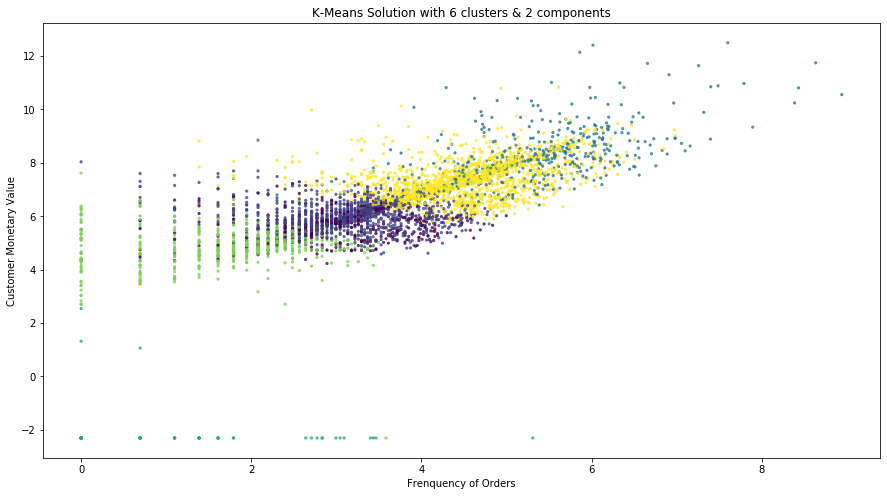

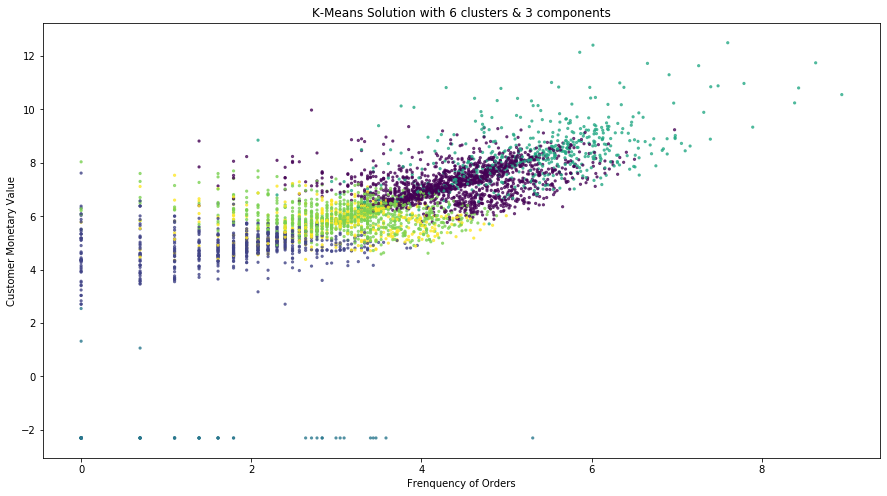

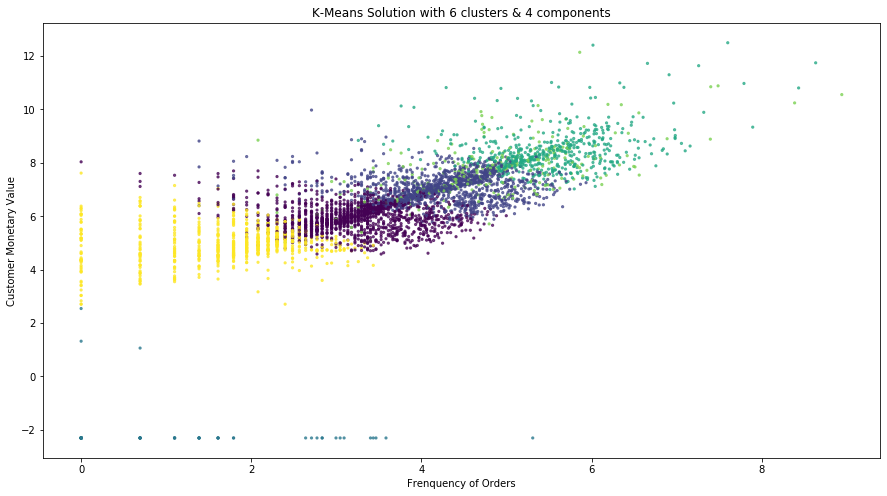

In [141]:
kmeans_sil_current = 0
kmeans_ca_current = 0

kmeans_sil_final_i = 0
kmeans_sil_final_j = 0
kmeans_sil_init = 0

kmeans_ca_final_i = 0
kmeans_ca_final_j = 0
kmeans_ca_init = 0

for i in range(6, 7):
    for j in range(2,5):

        pipe_kmeans = Pipeline([('scl', StandardScaler()),
                    ('pca', PCA(n_components=j)),  # change value of c for # of PCA components
                    ('clf', KMeans(n_clusters=i, n_jobs = -1, n_init = 100))]) # value of k changes in loop

        pipe_kmeans.fit(log_features)
        cluster_preds = pipe_kmeans.predict(log_features)

        print(f'K-Means Solution with ' + str(i) + ' clusters & ' + str(j) + ' components\n-----------------------')
        print('Calinski-Harabaz (CA) Cluster Variance Ration score: ', calinski_harabasz_score(log_features, cluster_preds))
        print('Cluster Silhouette score: ', metrics.silhouette_score(log_features, cluster_preds))
        print('\n')
        
        plt.figure(figsize=(15, 8))
        plt.title(f'K-Means Solution with ' + str(i) + ' clusters & ' + str(j) + ' components')
        plt.xlabel("Frenquency of Orders")
        plt.ylabel("Customer Monetary Value")
        plt.scatter(log_features.frequency, log_features.monetary, c=cluster_preds, s=5, alpha=.7)

        # merge cluster predicitons to unlogged, unscaled df and print summary stats by cluster
        customer_df['Cluster'] = cluster_preds
        for cluster in set(cluster_preds):
            print(f'Summary Stats for cluster # {cluster}')
            print(customer_df[customer_df['Cluster'] == cluster][['quantity', 'recency', 'frequency', 'monetary']].describe())
            pop_perc = round((len(customer_df[customer_df['Cluster'] == cluster]) / len(customer_df))*100, 2)
            rev_perc = round((sum(customer_df[customer_df['Cluster'] == cluster].monetary) / sum(customer_df.monetary))*100, 2)               
            total_spend = round(sum(customer_df[customer_df['Cluster'] == cluster].monetary), 2)
            print(f'This cluster represents {pop_perc}% of the population and {rev_perc}% of Total Revenue, with a total spend of £{total_spend}')
            print('\n\n\n')
        
            kmeans_sil_current = metrics.silhouette_score(log_features, cluster_preds)
            kmeans_cah_current = calinski_harabasz_score(log_features, cluster_preds)

            if sil_current > kmeans_sil_init:
                kmeans_sil_final_i = i
                kmeans_sil_final_j = j
                kmeans_sil_init = kmeans_sil_current
            else:
                pass

            if cah_current > kmeans_sil_init:
                kmeans_cah_final_i = i
                kmeans_cah_final_j = j
                kmeans_cah_init = kmeans_cah_current
            else:
                pass



In [142]:
print('best performing k-means cluster:')
print(str(kmeans_sil_final_i) + ' clusters')
print(str(kmeans_sil_final_j) + ' components')
print(str(kmeans_sil_init) + ' silhouette score')
print('')
print('best performing k-means cluster:')
print(str(kmeans_cah_final_i) + ' clusters')
print(str(kmeans_cah_final_j) + ' components')
print(str(kmeans_cah_init) + ' CAH score')

best performing k-means cluster:
6 clusters
4 components
0.2638467473115577 silhouette score

best performing k-means cluster:
6 clusters
4 components
2406.282655239334 CAH score


In [155]:
hac_sil_current = 0
hac_ca_current = 0

hac_sil_final_i = 0
hac_sil_final_j = 0
hac_sil_final_m = 0
hac_sil_init = 0

hac_ca_final_i = 0
hac_ca_final_j = 0
hac_ca_final_m = 0
hac_ca_init = 0

linkage_list = ["ward", "complete", "average", "single"]

for i in range(6,7):
    for j in range(2,5):
        for m in range(0,4):

            pipe_HAC = Pipeline([('scl', StandardScaler()),
                        ('pca', PCA(n_components=j)), # see above
                        ('clf', AgglomerativeClustering(n_clusters=i, linkage = linkage_list[m]),
                        )]) # see above

            pipe_HAC.fit(log_features)
            cluster_preds = pipe_HAC.fit_predict(log_features)

            print(f'HAC Solution with ' + str(i) + ' clusters & ' + str(j) + ' components ' + linkage_list[m] + '\n-----------------------')
            print('Calinski-Harabaz (CA) Cluster Variance Ration score: ', calinski_harabasz_score(log_features, cluster_preds))
            print('Cluster Silhouette score: ', metrics.silhouette_score(log_features, cluster_preds))
            print('\n')

#             plt.figure(figsize=(15, 8))
#             plt.title(f'HAC Solution with ' + str(i) + ' clusters & ' + str(j) + ' components ' + linkage_list[m])
#             plt.xlabel("Frenquency of Orders - log transformed")
#             plt.ylabel("Customer Monetary Value - log transformed")
#             plt.scatter(log_features.frequency, log_features.monetary, c=cluster_preds, s=5, alpha=.7)

            # merge cluster predicitons to unlogged, unscaled df and print summary stats by cluster
            customer_df['Cluster'] = cluster_preds
            for cluster in set(cluster_preds):
#                 print(f'Summary Stats for cluster # {cluster}')
#                 print(customer_df[customer_df['Cluster'] == cluster][['quantity', 'recency', 'frequency', 'monetary']].describe())
                pop_perc = round((len(customer_df[customer_df['Cluster'] == cluster]) / len(customer_df))*100, 2)
                rev_perc = round((sum(customer_df[customer_df['Cluster'] == cluster].monetary) / sum(customer_df.monetary))*100, 2)               
                total_spend = round(sum(customer_df[customer_df['Cluster'] == cluster].monetary), 2)
                print(f'Cluster {cluster}: This cluster represents {pop_perc}% of the population and {rev_perc}% of Total Revenue, with a total spend of £{total_spend}')
#                 print('\n\n\n')
                print('')

                hac_sil_init = metrics.silhouette_score(log_features, cluster_preds)
                hac_ca_init = calinski_harabasz_score(log_features, cluster_preds)

                if hac_sil_init > hac_sil_current:
                    hac_sil_final_i = i
                    hac_sil_final_j = j
                    hac_sil_final_m = m
                    hac_sil_current = hac_sil_init
                else:
                    pass

                if hac_ca_init > hac_ca_current:
                    hac_ca_final_i = i
                    hac_ca_final_j = j
                    hac_ca_final_m = m
                    hac_ca_current = hac_ca_init
                else:
                    pass

HAC Solution with 6 clusters & 2 components ward
-----------------------
Calinski-Harabaz (CA) Cluster Variance Ration score:  2373.4366911509396
Cluster Silhouette score:  0.2764224596255309


Cluster 0: This cluster represents 38.6% of the population and 51.92% of Total Revenue, with a total spend of £4154398.21

Cluster 1: This cluster represents 9.3% of the population and 38.52% of Total Revenue, with a total spend of £3082502.52

Cluster 2: This cluster represents 22.38% of the population and 5.72% of Total Revenue, with a total spend of £457942.67

Cluster 3: This cluster represents 10.59% of the population and 2.27% of Total Revenue, with a total spend of £181424.63

Cluster 4: This cluster represents 17.95% of the population and 1.73% of Total Revenue, with a total spend of £138237.18

Cluster 5: This cluster represents 1.18% of the population and -0.16% of Total Revenue, with a total spend of £-13182.79

HAC Solution with 6 clusters & 2 components complete
--------------------

Cluster 5: This cluster represents 1.18% of the population and -0.16% of Total Revenue, with a total spend of £-13182.79

HAC Solution with 6 clusters & 4 components complete
-----------------------
Calinski-Harabaz (CA) Cluster Variance Ration score:  1214.7676397411378
Cluster Silhouette score:  0.12249187264788676


Cluster 0: This cluster represents 37.7% of the population and 60.11% of Total Revenue, with a total spend of £4809406.52

Cluster 1: This cluster represents 9.85% of the population and 8.14% of Total Revenue, with a total spend of £651024.34

Cluster 2: This cluster represents 50.18% of the population and 9.55% of Total Revenue, with a total spend of £764509.16

Cluster 3: This cluster represents 0.53% of the population and 22.35% of Total Revenue, with a total spend of £1787997.4

Cluster 4: This cluster represents 1.2% of the population and -0.16% of Total Revenue, with a total spend of £-13182.79

Cluster 5: This cluster represents 0.53% of the population and 0.02% o

In [150]:
print('best performing HAC cluster:')
print(str(hac_sil_final_i) + ' clusters')
print(str(hac_sil_final_j) + ' components')
print(str(linkage_list[hac_sil_final_m]) + ' linkage')
print(str(hac_sil_current) + ' silhouette score')

print('')

print('best performing HAC cluster:')
print(str(hac_ca_final_i) + ' clusters')
print(str(hac_ca_final_j) + ' components')
print(str(linkage_list[hac_ca_final_m]) + ' linkage')
print(str(hac_ca_current) + ' CAH score')

best performing HAC cluster:
6 clusters
2 components
single linkage
0.43014677008479446 silhouette score

best performing HAC cluster:
6 clusters
2 components
ward linkage
2373.4366911509396 CAH score


HAC Solution with 6 clusters & 4 components ward
-----------------------
Calinski-Harabaz (CA) Cluster Variance Ration score:  2042.5544955965972
Cluster Silhouette score:  0.24088861623724264


Summary Stats for cluster # 0
           quantity      recency    frequency     monetary
count   1632.000000  1632.000000  1632.000000  1632.000000
mean     248.943015   102.620098    27.721814   416.042390
std      375.098455    97.447870    19.885905   259.199262
min        4.000000     0.000000     1.000000     0.000000
25%      134.000000    25.000000    14.000000   249.457500
50%      201.000000    63.000000    23.000000   363.720000
75%      296.500000   165.000000    35.000000   527.752500
max    12540.000000   365.000000   148.000000  3096.000000
Cluster 0: This cluster represents 37.66% of the population and 8.49% of Total Revenue, with a total spend of £678981.18




Summary Stats for cluster # 1
           quantity      recency    frequency      monetary
count   1488.000000  1488.000

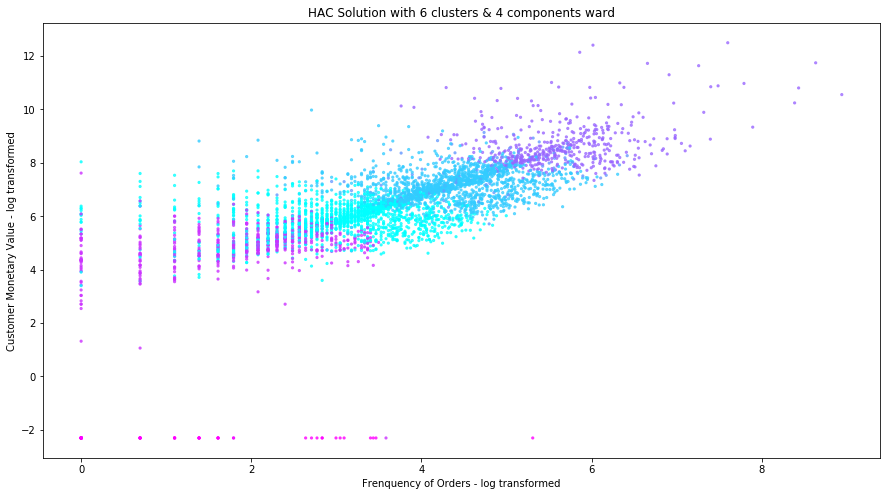

In [175]:
linkage_list = ["ward", "complete", "average", "single"]

i = 6
j = 4
m = 0

pipe_HAC = Pipeline([('scl', StandardScaler()),
            ('pca', PCA(n_components=j)), # see above
            ('clf', AgglomerativeClustering(n_clusters=i, linkage = linkage_list[m]),
            )]) # see above

pipe_HAC.fit(log_features)
cluster_preds = pipe_HAC.fit_predict(log_features)

print(f'HAC Solution with ' + str(i) + ' clusters & ' + str(j) + ' components ' + linkage_list[m] + '\n-----------------------')
print('Calinski-Harabaz (CA) Cluster Variance Ration score: ', calinski_harabasz_score(log_features, cluster_preds))
print('Cluster Silhouette score: ', metrics.silhouette_score(log_features, cluster_preds))
print('\n')

plt.figure(figsize=(15, 8))
plt.title(f'HAC Solution with ' + str(i) + ' clusters & ' + str(j) + ' components ' + linkage_list[m])
plt.xlabel("Frenquency of Orders - log transformed")
plt.ylabel("Customer Monetary Value - log transformed")
plt.scatter(log_features.frequency, log_features.monetary, c=cluster_preds, cmap='cool', s=5, alpha=.7)

# merge cluster predicitons to unlogged, unscaled df and print summary stats by cluster
customer_df['Cluster'] = cluster_preds
for cluster in set(cluster_preds):
    print(f'Summary Stats for cluster # {cluster}')
    print(customer_df[customer_df['Cluster'] == cluster][['quantity', 'recency', 'frequency', 'monetary']].describe())
    pop_perc = round((len(customer_df[customer_df['Cluster'] == cluster]) / len(customer_df))*100, 2)
    rev_perc = round((sum(customer_df[customer_df['Cluster'] == cluster].monetary) / sum(customer_df.monetary))*100, 2)               
    total_spend = round(sum(customer_df[customer_df['Cluster'] == cluster].monetary), 2)
    print(f'Cluster {cluster}: This cluster represents {pop_perc}% of the population and {rev_perc}% of Total Revenue, with a total spend of £{total_spend}')
    print('\n\n\n')
#     print('')

In [161]:
cluster_preds

array([5, 3, 1, ..., 4, 3, 1])

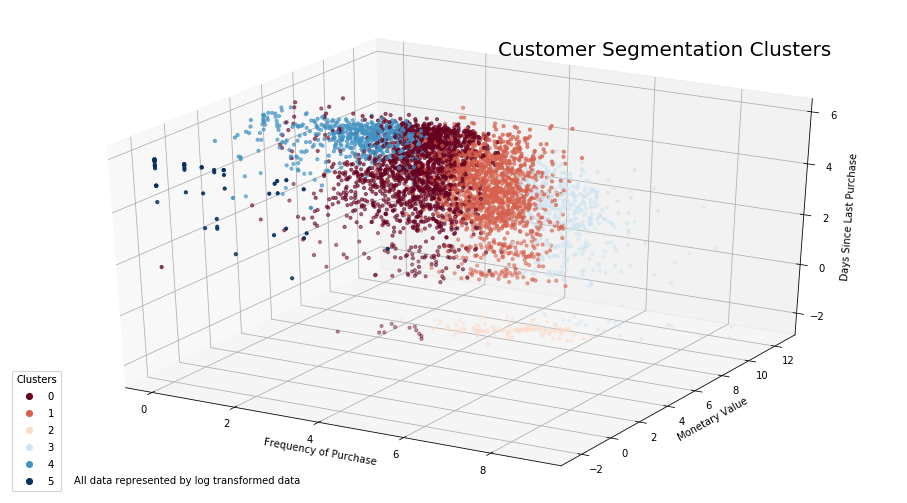

In [234]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(16,9))
ax = fig.add_subplot(111, projection='3d')

x = log_features.frequency
y = log_features.monetary
z = log_features.recency

ax.set_xlabel('Frequency of Purchase')
ax.set_ylabel('Monetary Value')
ax.set_zlabel('Days Since Last Purchase')

scatter = ax.scatter(x, y, z, c=cluster_preds, s=10, cmap="RdBu")

legend1 = ax.legend(*scatter.legend_elements(),
                    loc="lower left", title="Clusters")
ax.add_artist(legend1)

ax.text2D(0.55, 0.9, "Customer Segmentation Clusters", transform=ax.transAxes, size = 20)
ax.text2D(0.075, 0.025, "All data represented by log transformed data", transform=ax.transAxes, size = 10)

plt.show()

